In [10]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

import nltk
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
from wordcloud import WordCloud,STOPWORDS
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from bs4 import BeautifulSoup
import re,string,unicodedata
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,f1_score
from sklearn.model_selection import train_test_split
from string import punctuation
from nltk import pos_tag
from nltk.corpus import wordnet

In [1]:
import types
def imports():
    for name, val in globals().items():
        if isinstance(val, types.ModuleType):
            yield val.__name__

list(set(imports()))

['types', 'builtins']

In [2]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.


#### Data loading 

In [12]:
df = pd.read_csv('dataset/IMDB Dataset.csv')
df.head()

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive


#### Data preprocessing and EDA

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   review     50000 non-null  object
 1   sentiment  50000 non-null  object
dtypes: object(2)
memory usage: 781.4+ KB


<Axes: xlabel='count', ylabel='sentiment'>

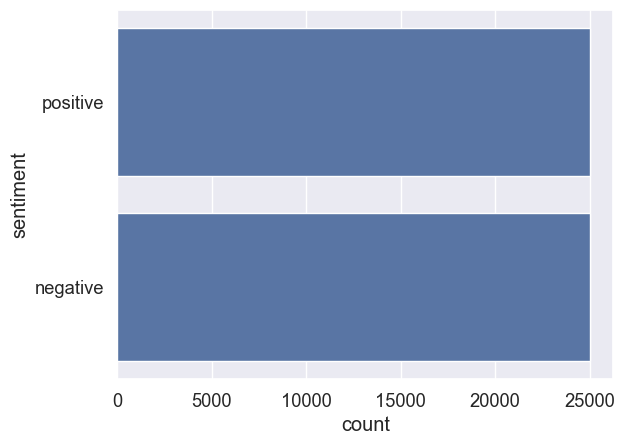

In [14]:
sns.set(style = "darkgrid" , font_scale = 1.2)
sns.countplot(df.sentiment)

In [15]:
#Let's check for missing values 
df.isna().sum()

review       0
sentiment    0
dtype: int64

As you can see we don't have missing values and dataset is balanced

In [16]:
#stopwords 
stop = set(stopwords.words('english'))
punctuation = list(string.punctuation)
stop.update(punctuation)

In [18]:
def strip_html(text):
    soup = BeautifulSoup(text, "html.parser")
    return soup.get_text()

#Removing the square brackets
def remove_between_square_brackets(text):
    return re.sub('\[[^]]*\]', '', text)
# Removing URL's
def remove_between_square_brackets(text):
    return re.sub(r'http\S+', '', text)
#Removing the stopwords from text
def remove_stopwords(text):
    final_text = []
    for i in text.split():
        if i.strip().lower() not in stop and i.strip().lower().isalpha():
            final_text.append(i.strip().lower())
    return " ".join(final_text)
#Removing the noisy text
def denoise_text(text):
    text = strip_html(text)
    text = remove_between_square_brackets(text)
    text = remove_stopwords(text)
    return text
#Apply function on review column
df['review']=df['review'].apply(denoise_text)

In [19]:
#Let's encode positive => 1 and negative => 0 
df.sentiment.replace('positive',1,inplace=True)
df.sentiment.replace('negative',0,inplace = True)
df.head()

,review,sentiment
0,one reviewers mentioned watching oz episode ex...,1
1,wonderful little filming technique fashion giv...,1
2,thought wonderful way spend time hot summer si...,1
3,basically family little boy thinks zombie clos...,0
4,petter time visually stunning film mattei offe...,1


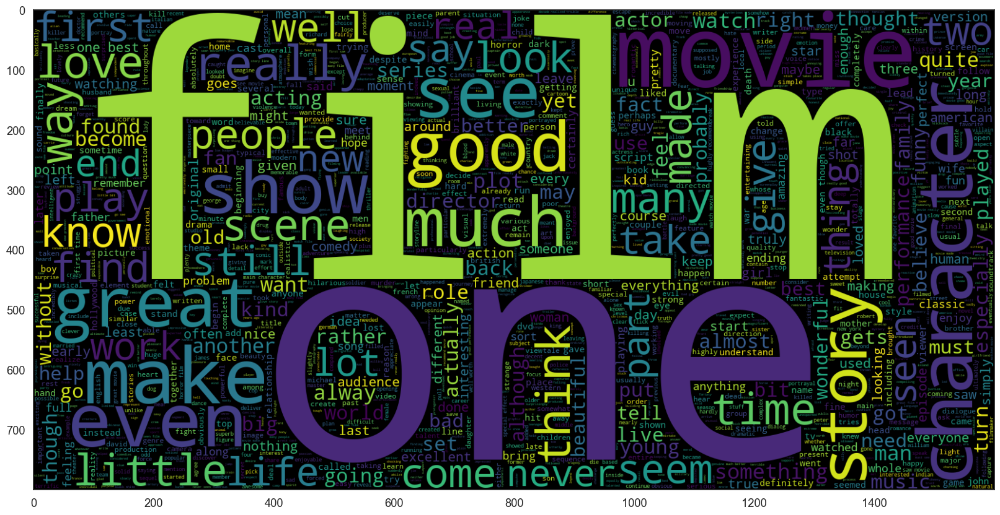

In [20]:
#Wordcloud for label 1 
sns.set(style = "white" , font_scale = 1.2)
plt.figure(figsize = (20,20)) # Positive Review Text
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df[df.sentiment == 1].review))
plt.imshow(wc , interpolation = 'bilinear')

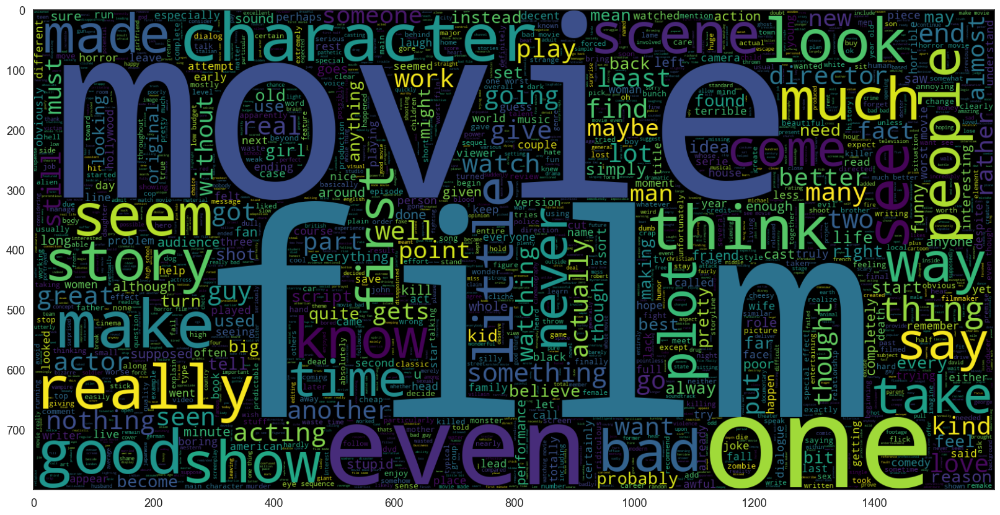

In [21]:
#Wordclud for label 0 
plt.figure(figsize = (20,20)) # Negative Review Text
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df[df.sentiment == 0].review))
plt.imshow(wc , interpolation = 'bilinear')

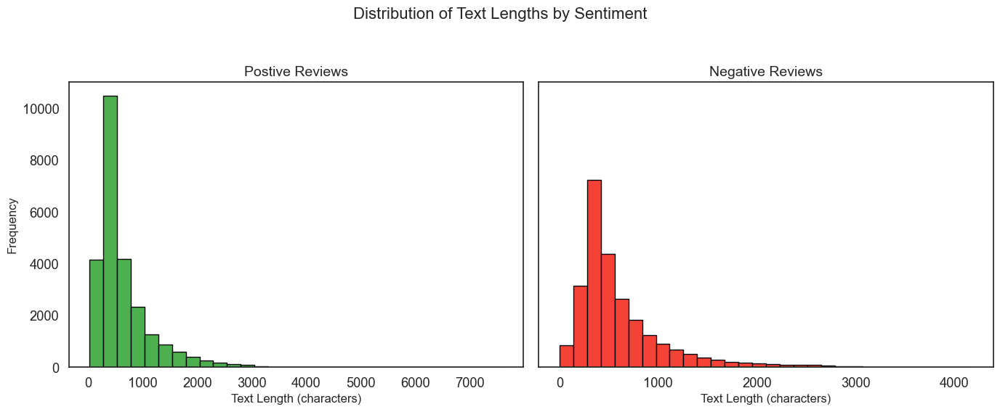

In [24]:
#Number of characters in text 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Text lengths for good reviews
text_len_pos = df[df['sentiment'] == 1]['review'].str.len()
ax1.hist(text_len_pos, bins=30, color='#4CAF50', edgecolor='black')  # green shade
ax1.set_title('Postive Reviews', fontsize=14)
ax1.set_xlabel('Text Length (characters)', fontsize=12)
ax1.set_ylabel('Frequency', fontsize=12)

# Text lengths for bad reviews
text_len_neg = df[df['sentiment'] == 0]['review'].str.len()
ax2.hist(text_len_neg, bins=30, color='#F44336', edgecolor='black')  # red shade
ax2.set_title('Negative Reviews', fontsize=14)
ax2.set_xlabel('Text Length (characters)', fontsize=12)

# Main title
fig.suptitle('Distribution of Text Lengths by Sentiment', fontsize=16)

# Improve layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

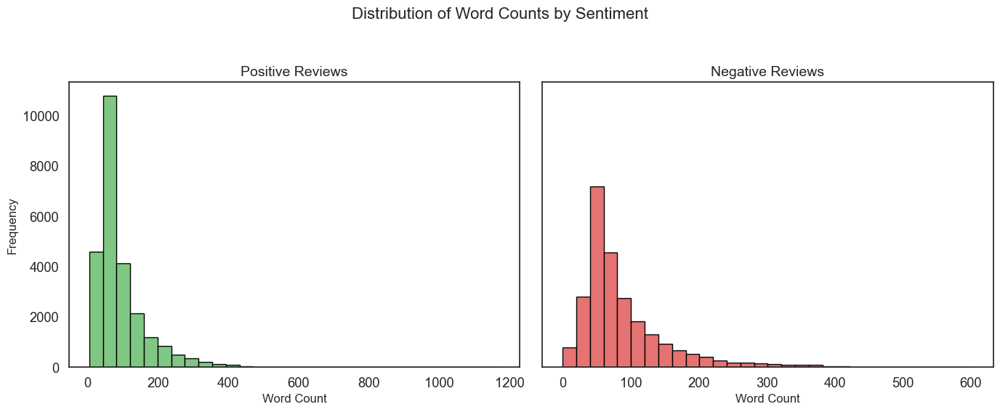

In [26]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Word counts for good reviews
word_count_pos = df[df['sentiment'] == 1]['review'].str.split().map(len)
ax1.hist(word_count_pos, bins=30, color='#81C784', edgecolor='black')  # soft green
ax1.set_title('Positive Reviews', fontsize=14)
ax1.set_xlabel('Word Count', fontsize=12)
ax1.set_ylabel('Frequency', fontsize=12)

# Word counts for bad reviews
word_count_neg = df[df['sentiment'] == 0]['review'].str.split().map(len)
ax2.hist(word_count_neg, bins=30, color='#E57373', edgecolor='black')  # soft red
ax2.set_title('Negative Reviews', fontsize=14)
ax2.set_xlabel('Word Count', fontsize=12)

# Main title
fig.suptitle('Distribution of Word Counts by Sentiment', fontsize=16)

# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [27]:
#Let's make a corpus 
def get_corpus(text):
    words = []
    for i in text:
        for j in i.split():
            words.append(j.strip())
    return words
corpus = get_corpus(df.review)
corpus[:5]

['one', 'reviewers', 'mentioned', 'watching', 'oz']

In [28]:
#Let's get most common words 
from collections import Counter
counter = Counter(corpus)
most_common = counter.most_common(10)
most_common = dict(most_common)
most_common

{'movie': 61496,
 'film': 55088,
 'one': 45067,
 'like': 37303,
 'would': 23815,
 'even': 23720,
 'good': 23475,
 'really': 21806,
 'see': 20906,
 'get': 17692}

In [29]:
#let's define a fucntion for unigram analysis
def get_top_text_ngrams(corpus, n, g):
    vec = CountVectorizer(ngram_range=(g, g)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [33]:
#Common words in review 
most_common_uni = get_top_text_ngrams(df.review,20,1)
most_common_uni = dict(most_common_uni)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(most_common_uni.keys())
temp["Count"] = list(most_common_uni.values())
fig = px.bar(temp, x="Count", y="Common_words", title='Commmon Words in Text', orientation='h', 
             width=700, height=700,color='Common_words')
fig.show()


In [34]:
#Let's create bigram 
most_common_bi = get_top_text_ngrams(df.review,20,2)
most_common_bi = dict(most_common_bi)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(most_common_bi.keys())
temp["Count"] = list(most_common_bi.values())
fig = px.bar(temp, x="Count", y="Common_words", title='Commmon Bigrams in Text', orientation='h', 
             width=700, height=700,color='Common_words')
fig.show()

In [35]:
#Let's create trigrams 
most_common_tri = get_top_text_ngrams(df.review,20,3)
most_common_tri = dict(most_common_tri)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(most_common_tri.keys())
temp["Count"] = list(most_common_tri.values())
fig = px.bar(temp, x="Count", y="Common_words", title='Commmon Trigrams in Text', orientation='h', 
             width=700, height=700,color='Common_words')
fig.show()

#### Modelling 

In [97]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [98]:
df.head()

,review,sentiment
0,one reviewers mentioned watching oz episode ex...,1
1,wonderful little filming technique fashion giv...,1
2,thought wonderful way spend time hot summer si...,1
3,basically family little boy thinks zombie clos...,0
4,petter time visually stunning film mattei offe...,1


In [99]:
train_data, test_data = train_test_split(df, test_size = 0.2, random_state=42)

In [102]:
display(test_data.shape)
display(train_data.shape)

(10000, 2)

(40000, 2)

In [104]:
#Let's initialize tokenizer
tokenizer = Tokenizer(num_words = 5000)
tokenizer.fit_on_texts(train_data["review"])

In [105]:
X_train = pad_sequences(tokenizer.texts_to_sequences(train_data["review"]), maxlen=200)
X_test = pad_sequences(tokenizer.texts_to_sequences(test_data["review"]), maxlen=200)

In [108]:
print('X_train :')
display(X_train)
print('X_test :')
display(X_test)

X_train :


array([[   0,    0,    0, ...,  349,   87,  185],
       [   0,    0,    0, ...,    1,   18,   28],
       [   0,    0,    0, ...,  316,  187,  583],
       ...,
       [   0,    0,    0, ...,  345, 1072, 1568],
       [   0,    0,    0, ...,   22, 1086,   28],
       [   0,    0,    0, ...,   41,  347,   11]],
      shape=(40000, 200), dtype=int32)

X_test :


array([[   0,    0,    0, ...,  320,  454,  727],
       [   0,    0,    0, ...,   28, 1765,    9],
       [   0,    0,    0, ...,   34,  723,  837],
       ...,
       [   0,    0,    0, ..., 1988,  375,  113],
       [   0,    0,    0, ...,  555,  160,   61],
       [   0,    0,    0, ...,    7,    9,  198]],
      shape=(10000, 200), dtype=int32)

In [109]:
Y_train = train_data["sentiment"]
Y_test = test_data["sentiment"]

In [110]:
#Let's build LSTM model 
model = Sequential()
model.add(Embedding(input_dim =5000, output_dim = 128, input_length = 200))
model.add(LSTM(128, dropout=0.2, recurrent_dropout = 0.2))
model.add(Dense(1, activation = "sigmoid"))

In [111]:
#let's print model summary 
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [112]:
model.compile(optimizer = "adam", loss="binary_crossentropy", metrics=["accuracy"])

In [113]:

model.fit(X_train, Y_train, epochs = 5, batch_size = 64, validation_split = 0.2)

Epoch 1/5
500/500 ━━━━━━━━━━━━━━━━━━━━ 199s 392ms/step - accuracy: 0.7329 - loss: 0.5076 - val_accuracy: 0.8593 - val_loss: 0.3341
Epoch 2/5
500/500 ━━━━━━━━━━━━━━━━━━━━ 155s 310ms/step - accuracy: 0.8774 - loss: 0.3042 - val_accuracy: 0.8579 - val_loss: 0.3681
Epoch 3/5
500/500 ━━━━━━━━━━━━━━━━━━━━ 151s 302ms/step - accuracy: 0.8934 - loss: 0.2674 - val_accuracy: 0.8566 - val_loss: 0.3405
Epoch 4/5
500/500 ━━━━━━━━━━━━━━━━━━━━ 147s 294ms/step - accuracy: 0.9127 - loss: 0.2259 - val_accuracy: 0.8579 - val_loss: 0.3755
Epoch 5/5
500/500 ━━━━━━━━━━━━━━━━━━━━ 147s 295ms/step - accuracy: 0.9273 - loss: 0.1943 - val_accuracy: 0.8503 - val_loss: 0.3605


In [117]:
loss,accuracy = model.evaluate(X_test,Y_test)
display(loss)
display(accuracy)

313/313 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - accuracy: 0.8466 - loss: 0.3561


0.35997241735458374

0.8504999876022339

In [121]:
pred = model.predict(X_test)
pred[:5]

313/313 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step


array([[0.65407866],
       [0.9688913 ],
       [0.02129859],
       [0.98986226],
       [0.04111619]], dtype=float32)

In [122]:
pred = np.round(pred).astype(int)
pred[:5]

array([[1],
       [1],
       [0],
       [1],
       [0]])

In [125]:
#Classification report 
print(classification_report(Y_test, pred, target_names = ['Negative Reviews','Positive Reviews']))

                  precision    recall  f1-score   support

Negative Reviews       0.85      0.84      0.85      4961
Positive Reviews       0.85      0.86      0.85      5039

        accuracy                           0.85     10000
       macro avg       0.85      0.85      0.85     10000
    weighted avg       0.85      0.85      0.85     10000



Text(88.24999999999999, 0.5, 'Actual')

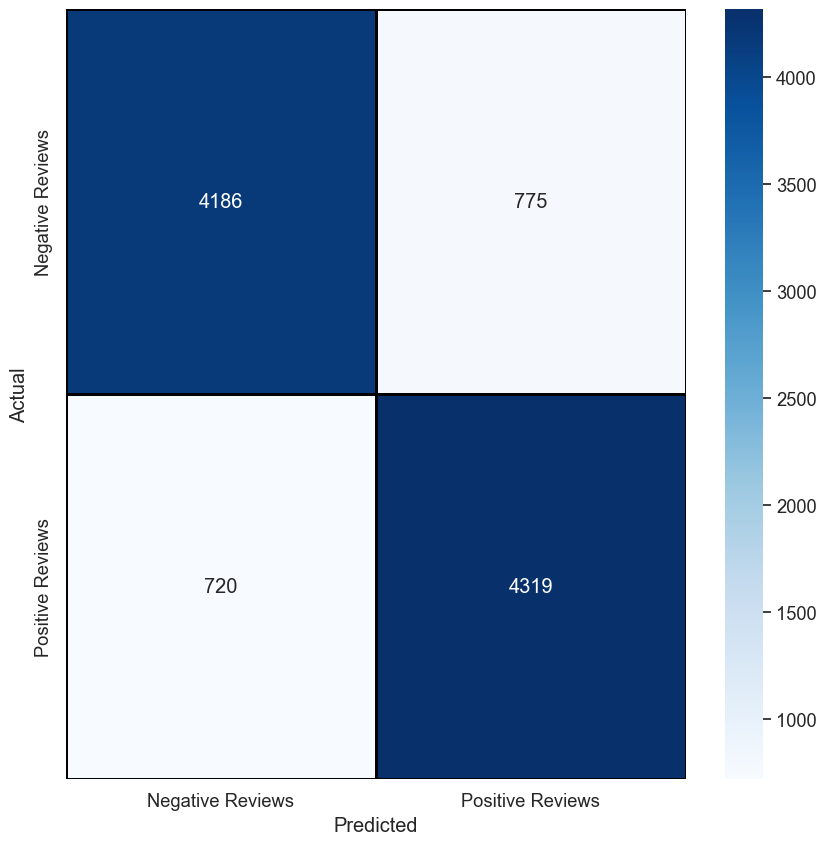

In [127]:
cm = confusion_matrix(Y_test,pred)
plt.figure(figsize = (10,10))
sns.heatmap(cm,cmap= "Blues", linecolor = 'black' , linewidth = 1 , annot = True, fmt='' , xticklabels = ['Negative Reviews','Positive Reviews'] , yticklabels = ['Negative Reviews','Positive Reviews'])
plt.xlabel("Predicted")
plt.ylabel("Actual")

In [118]:
#Let's build and predictive system 
def predictive_system(review):
  sequences = tokenizer.texts_to_sequences([review])
  padded_sequence = pad_sequences(sequences, maxlen=200)
  prediction = model.predict(padded_sequence)
  sentiment = "positive" if prediction[0][0] > 0.5 else "negative"
  return sentiment

predictive_system("This movie was very boring and too long to see")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


'negative'

In [119]:
predictive_system('Very good movie , i can not wait next chapter')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


'positive'

#### Model saving 

In [115]:
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='absl')
model.save("model.h5")

In [116]:
import joblib 
joblib.dump(tokenizer,'tokenizer.pkl')

['tokenizer.pkl']